# Курсовой проект

1. [Импорт библиотек](#import)
2. [Загрузка данных](#load_data) <br>
    2.1. [Целевая переменная](#target_feature) <br>
    2.2. [Количественные переменные](#num_features) <br>
    2.3. [Номинативные переменные](#cat_features) <br>
3. [Предобработка данных](#preparation)
4. [Построение новых признаков](#new_features)
5. [Построение модели](#model)
6. [Сохранение результатов](#results)

**Задача** <br>
Предсказать на основе имеющейся информации тип совершеннего в Сан-Франциско преступления. 

## Импорт библиотек <a class="anchor" id="import"></a>

In [658]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import catboost as catb
import xgboost as xgb
from math import radians, cos, sin, asin, sqrt
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from keplergl import KeplerGl

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
sns.set(style='whitegrid')

In [4]:
label_font = {
    "fontsize": 12,
    "family": "serif",
    "fontweight":"bold"
}

In [5]:
import warnings
warnings.simplefilter('ignore')

## Загрузка данных <a class="anchor" id="load_data"></a>

In [6]:
TEST_PATH = 'test.csv'
TRAIN_PATH = 'train.csv'

df = pd.read_csv(TRAIN_PATH)
df.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


**Целевая переменная** <br>
   - __Category__ - тип совершенного преступления

**Признаки** <br>
   - __Dates__ - время правонарушения
   - __Descript__ - детальная информация о преступлении _(содержится только в тренировочном датасете)_
   - __DayOfWeek__ - день недели
   - __PdDistrict__ - название полицейского отдела, в котором зарегистрировано правонарушение
   - __Resolution__ - итоговое решение принятое в ходе расследования преступления _(содержится только в тренировочном датасете)_
   - __Address__ - приблизительный адрес места происшествия
   - __X__ - долгота
   - __Y__ - широта

Сразу стоит отметить, что признаки __Descript__ и __Resolution__ не представляют существенного интереса для нашего исследования, так как присутствуют только в тренировочном датасете, поэтому их можно удалить.

In [7]:
df.drop(columns=['Descript', 'Resolution'], inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       878049 non-null  object 
 1   Category    878049 non-null  object 
 2   DayOfWeek   878049 non-null  object 
 3   PdDistrict  878049 non-null  object 
 4   Address     878049 non-null  object 
 5   X           878049 non-null  float64
 6   Y           878049 non-null  float64
dtypes: float64(2), object(5)
memory usage: 46.9+ MB


Отсюда можно сделать следующие выводы: 
 1. В датасете отсутствуют пропуски; 
 2. Большинство признаков представлено в текстовом формате.

Проведем первичный анализ данных. Это позволит лучше понять их структуру и потенциально выявить закономерности, которые можно будет использовать в дальнейшем.

### Целевая переменная <a class="anchor" id="target_feature"></a>

In [9]:
TARGET = df['Category']

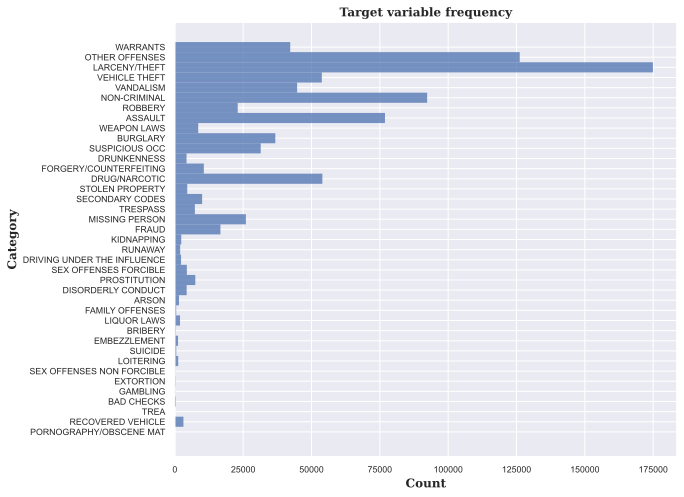

In [10]:
plt.figure(figsize=(9, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(y=TARGET)
plt.title('Target variable frequency', fontdict=label_font)
plt.ylabel('Category', fontdict=label_font)
plt.xlabel('Count', fontdict=label_font)
plt.show()

In [11]:
TARGET.value_counts()

LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQUOR LAWS 

In [12]:
TARGET.nunique()

39

Видим, что в датасете содержится информация о __39__ различных видах преступлений, то есть можно утверждать, что имеет место задача многоклассовой классификации. Кроме того следует заметить, что количество правонарушений разных типов сильно отличается, что указывает на несбалансированность данных.

### Количественные переменные <a class="anchor" id="num_features"></a>

В датасете только признаки __X__ и __Y__, которые описывают долготу и широту места преступления, являются количественными переменными.

In [13]:
df.describe()

,X,Y
count,878049.000000,878049.000000
mean,-122.422616,37.771020
std,0.030354,0.456893
min,-122.513642,37.707879
25%,-122.432952,37.752427
50%,-122.416420,37.775421
75%,-122.406959,37.784369
max,-120.500000,90.000000


Визуализируем имеющиеся данные на карте города и сохраним полученный результат в отдельном файле `sf_crime`. 

In [14]:
config = {
  "version": "v1",
  "config": {
    "visState": {
      "filters": [],
      "layers": [
        {
          "id": "d56s2tkr",
          "type": "cluster",
          "config": {
            "dataId": "Data",
            "label": "Point",
            "color": [
              18,
              147,
              154
            ],
            "columns": {
              "lat": "Latitude",
              "lng": "Longitude"
            },
            "isVisible": True,
            "visConfig": {
              "opacity": 0.8,
              "clusterRadius": 40,
              "colorRange": {
                "name": "Ice And Fire",
                "type": "diverging",
                "category": "Uber",
                "colors": [
                  "#0198BD",
                  "#49E3CE",
                  "#E8FEB5",
                  "#FEEDB1",
                  "#FEAD54",
                  "#D50255"
                ]
              },
              "radiusRange": [
                0,
                50
              ],
              "colorAggregation": "count"
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile"
          }
        }
      ],
      "interactionConfig": {
        "tooltip": {
          "fieldsToShow": {
            "Data": [
              {
                "name": "Dates",
                "format": None
              },
              {
                "name": "Category",
                "format": None
              },
              {
                "name": "DayOfWeek",
                "format": None
              },
              {
                "name": "PdDistrict",
                "format": None
              },
              {
                "name": "Address",
                "format": None
              }
            ]
          },
          "compareMode": False,
          "compareType": "absolute",
          "enabled": True
        },
        "brush": {
          "size": 0.5,
          "enabled": False
        },
        "geocoder": {
          "enabled": False
        },
        "coordinate": {
          "enabled": False
        }
      },
      "layerBlending": "normal",
      "splitMaps": [],
      "animationConfig": {
        "currentTime": None,
        "speed": 1
      }
    },
    "mapState": {
      "bearing": 0,
      "dragRotate": False,
      "latitude": 37.75920284522489,
      "longitude": -122.45842866471436,
      "pitch": 0,
      "zoom": 11.748528530766443,
      "isSplit": False
    },
    "mapStyle": {
      "styleType": "dark",
      "topLayerGroups": {},
      "visibleLayerGroups": {
        "label": True,
        "road": True,
        "border": False,
        "building": True,
        "water": True,
        "land": True,
        "3d building": False
      },
      "threeDBuildingColor": [
        9.665468314072013,
        17.18305478057247,
        31.1442867897876
      ],
      "mapStyles": {}
    }
  }
}

In [39]:
map_ = KeplerGl(height=700, config=config)
map_.add_data(df.rename(columns={'X': 'Longitude', 'Y': 'Latitude'}), 'Data')
map_.save_to_html(file_name='./sf_crime.html')

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to ./sf_crime.html!


Полученная карта позволяет также лучше рассмотреть районы города с высокой степенью криминогенности.

Проанализируем внимательнее значения долготы и широты на предмет выбросов.

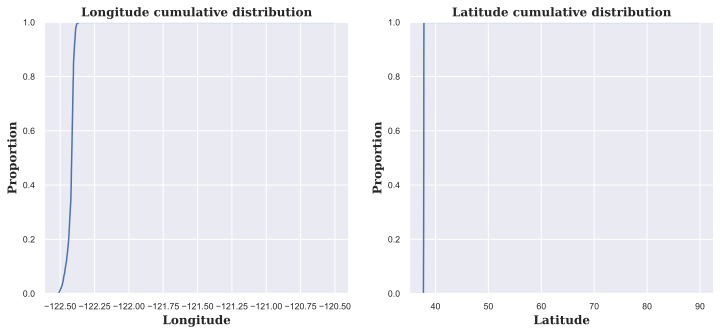

In [61]:
fig, ax = plt.subplots(nrows=1, ncols=2)
ax1, ax2 = ax.flatten()

fig.set_size_inches(12, 5)
fig.subplots_adjust(hspace=1)
sns.set(font_scale=0.8, style='darkgrid')


sns.ecdfplot(x=df['X'], ax=ax1)
ax1.set_title('Longitude cumulative distribution', fontdict=label_font)
ax1.set_ylabel('Proportion', fontdict=label_font)
ax1.set_xlabel('Longitude', fontdict=label_font)

sns.ecdfplot(x=df['Y'], ax=ax2)
ax2.set_title('Latitude cumulative distribution', fontdict=label_font)
ax2.set_ylabel('Proportion', fontdict=label_font)
ax2.set_xlabel('Latitude', fontdict=label_font)


plt.show()

In [73]:
fig, ax = plt.subplots(nrows=2, ncols=1)
ax1, ax2 = ax.flatten()

fig.set_size_inches(9, 20)
fig.subplots_adjust(wspace=.5)
sns.set(font_scale=0.8, style='darkgrid')


sns.boxplot(x=df['X'], y=TARGET, ax=ax1)
ax1.set_title('Longitude distribution', fontdict=label_font)
ax1.set_ylabel('Category', fontdict=label_font)
ax1.set_xlabel('Longitude', fontdict=label_font)
ax1.grid()

sns.boxplot(x=df['Y'], y=TARGET, ax=ax2)
ax2.set_title('Latitude distribution', fontdict=label_font)
ax2.set_ylabel('Category', fontdict=label_font)
ax2.set_xlabel('Latitude', fontdict=label_font)
ax2.grid()

plt.show()

Как видим значения долготы и широты находятся в довольно узких границах, которые соответствуют координатам Сан-Франциско, для которого собрана исследуемая информация. Однако присутствует небольшое количество выбросов, которые наблюдаются для разных значений целевой переменной. Проанализируем их подробнее, воспользовавшись тем фактом, что для этих наблюдений значения долготы/широты являются максимальными в датасете.

In [19]:
df[df['Y'] == 90].head()

,Dates,Category,DayOfWeek,PdDistrict,Address,X,Y
660485,2005-12-30 17:00:00,LARCENY/THEFT,Friday,TENDERLOIN,5THSTNORTH ST / OFARRELL ST,-120.5,90.0
660711,2005-12-30 00:34:00,ASSAULT,Friday,BAYVIEW,JAMESLICKFREEWAY HY / SILVER AV,-120.5,90.0
660712,2005-12-30 00:34:00,ASSAULT,Friday,BAYVIEW,JAMESLICKFREEWAY HY / SILVER AV,-120.5,90.0
661106,2005-12-29 00:07:00,NON-CRIMINAL,Thursday,TENDERLOIN,5THSTNORTH ST / EDDY ST,-120.5,90.0
666430,2005-11-30 11:25:00,OTHER OFFENSES,Wednesday,TENDERLOIN,5THSTNORTH ST / ELLIS ST,-120.5,90.0


In [16]:
df[df['Y'] == 90]['X'].value_counts()

-120.5    67
Name: X, dtype: int64

In [18]:
df[df['X'] == -120.5]['Y'].value_counts()

90.0    67
Name: Y, dtype: int64

Таким образом видим, что для _67_ наблюдений в датасете одновременно достигаются максимальные значения долготы и широты, которые при этом, важно отметить, не соответствуют координатам Сан-Франциско. Далее можно создать дополнительный признак, который будет принимать значение равное _1_, если наблюдение является выбросом.

### Номинативные переменные <a class="anchor" id="cat_features"></a>

#### Dates

Данная переменная содержит информацию о времени правонарушения. По умолчанию она представлена в текстовом формате, преобразуем ее в формат даты и создадим новые признаки на ее основе.

In [15]:
df['Dates']= pd.to_datetime(df['Dates'], format='%Y-%m-%d %H:%M:%S')

In [16]:
df['Year'] = df['Dates'].dt.year
df['Month'] = df['Dates'].dt.month
df['Day'] = df['Dates'].dt.day
df['Hour'] = df['Dates'].dt.hour
df['Minute'] = df['Dates'].dt.minute
df['Second'] = df['Dates'].dt.second
df.head()

,Dates,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,Minute,Second
0,2015-05-13 23:53:00,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,53,0
1,2015-05-13 23:53:00,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,53,0
2,2015-05-13 23:33:00,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23,33,0
3,2015-05-13 23:30:00,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23,30,0
4,2015-05-13 23:30:00,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23,30,0


In [17]:
df['Second'].value_counts()

0    878049
Name: Second, dtype: int64

Видно, что все наблюдения имеют одинаковое значение секунд, поэтому этот признак будет бесполезен для целей дальнейшего анализа и его можно исключить.

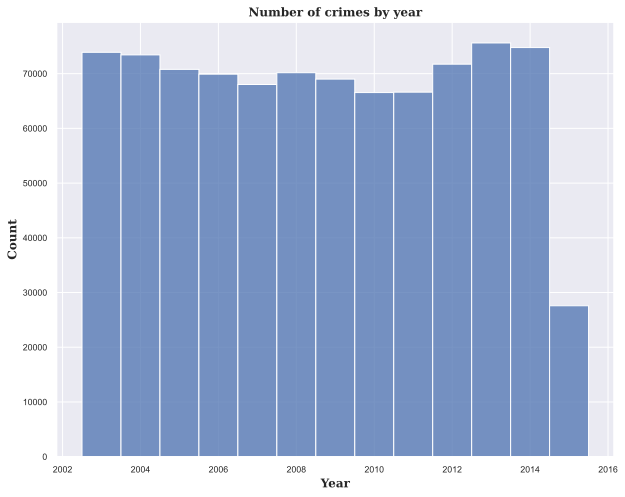

In [82]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df['Year'], bins=13, discrete=True)
plt.title('Number of crimes by year', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Year', fontdict=label_font)
plt.show()

Количество преступлений несильно изменяется между годами. Можно заметить однако, что в последние 3 года общее количество преступлений увеличилось по сравнению с показателями характерными для середины-конца нулевых. Кроме того выделяется 2015 год. Низкий показатель связан с тем, что датасет содержит данные только до мая 2015 года.

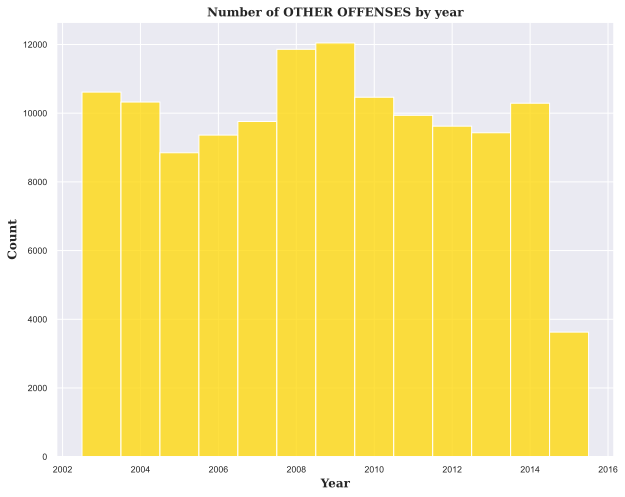

In [91]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df.loc[TARGET=='OTHER OFFENSES','Year'], color='gold', bins=13, discrete=True)
plt.title('Number of OTHER OFFENSES by year', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Year', fontdict=label_font)
plt.show()

Однако как показывает этот график тенденция для отдельных видов преступлений может сильно отличаться. Например, для данного типа правонарушений заметен рост в конце нулевых, после которого произошел возврат к предыдущим уровням.

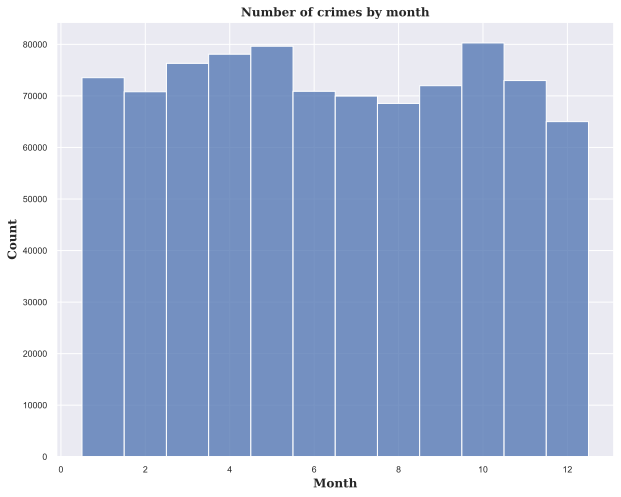

In [77]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df['Month'], bins=12, discrete=True)
plt.title('Number of crimes by month', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Month', fontdict=label_font)
plt.show()

Пиковые значения преступлений наблюдаются в мае и октябре. Однако стоит заметить, что т.к. датасет содержит только информацию до мая в 2015 году, это может искажать картину.

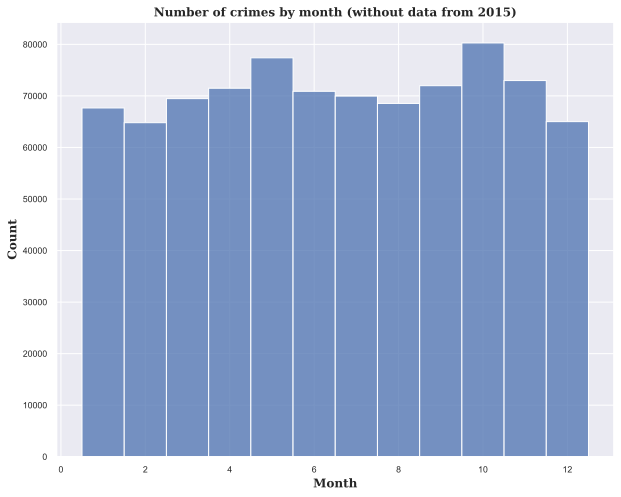

In [76]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df.loc[df['Year'] < 2015,'Month'], bins=12, discrete=True)
plt.title('Number of crimes by month (without data from 2015)', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Month', fontdict=label_font)
plt.show()

Этот график более очевидно представляет первенство октября в рейтинге самых криминальных месяцев в Сан-Франциско. Также можно утверждать, что в летние месяцы количество преступлений снижается. Кроме того заметно, что зимой регистрируется меньше преступлений, чем, например, осенью или весной. Возможно стоит добавить новый признак, который будет хранить информацию о времени года.

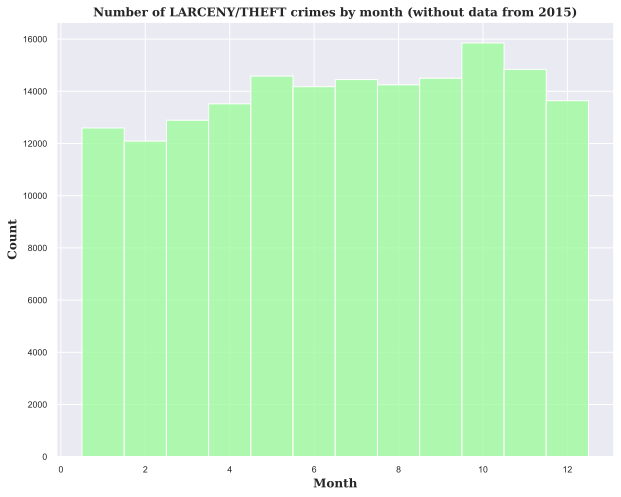

In [90]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df.loc[(df['Year'] < 2015) & (TARGET == 'LARCENY/THEFT'),'Month'], 
             color='palegreen', bins=12, discrete=True)
plt.title('Number of LARCENY/THEFT crimes by month (without data from 2015)', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Month', fontdict=label_font)
plt.show()

Если посмотреть аналогичное распределние, но для конкретного типа преступлений, самого популярного - `LARCENY/THEFT`, то по-прежнему видно превосходство октября над остальными месяцами с точки зрения количества правонарушений. Также видно, что зимой преступлений этого типа совершается меньше. Однако какой-то просадки в летние месяцы, характерной для общего числа преступлений, тут не наблюдается.

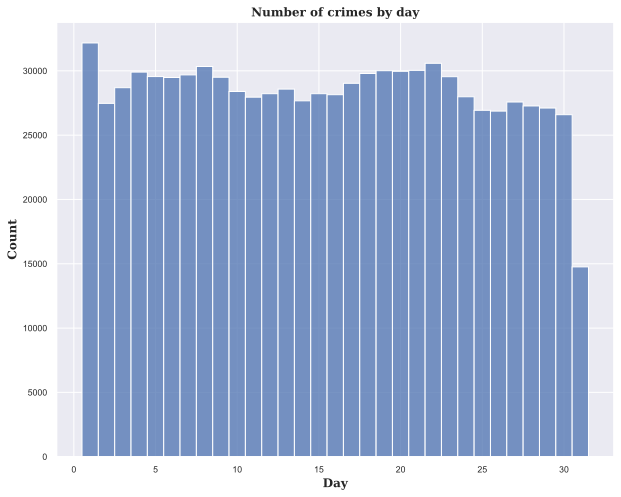

In [78]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df['Day'], bins=31, discrete=True)
plt.title('Number of crimes by day', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Day', fontdict=label_font)
plt.show()

Из этого графика видно, что большинство преступлений регистрируется в первый день месяца. Затем наблюдается спад в середине месяца и подъем в 20-х числах. Можно утверждать, что 31ого числа фиксируется меньше всего нарушений. Вкупе с пиком первого числа это может свидетельствовать о каких-то особенностях учета нарушений правоохранительными органами.

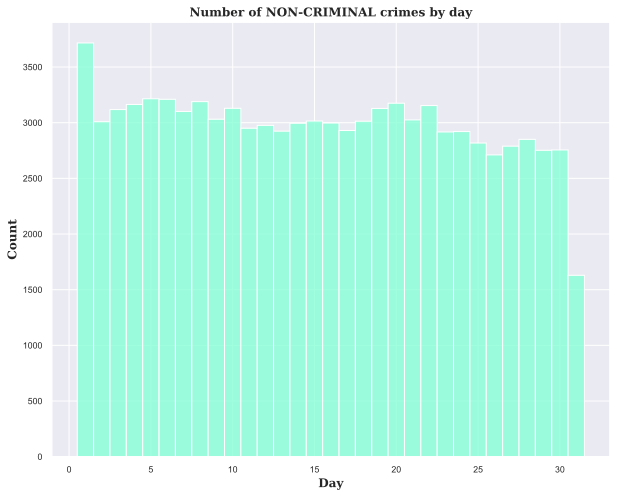

In [95]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df.loc[TARGET=='NON-CRIMINAL','Day'], color='aquamarine', bins=31, discrete=True)
plt.title('Number of NON-CRIMINAL crimes by day', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Day', fontdict=label_font)
plt.show()

Для данного типа нарушений график распределения по дням довольно схож с общей картиной.

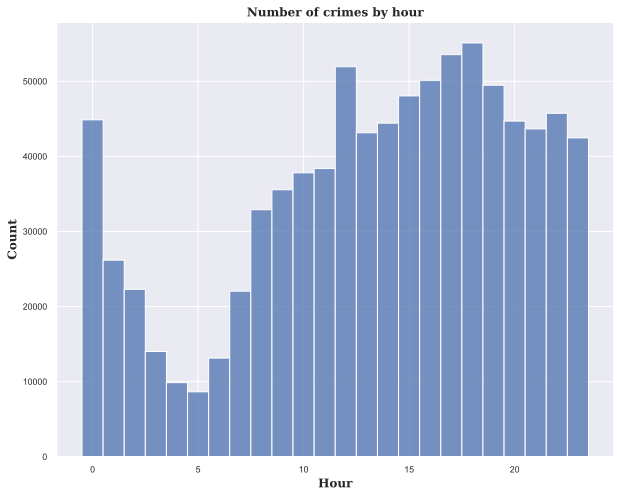

In [79]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df['Hour'], bins=24, discrete=True)
plt.title('Number of crimes by hour', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Hour', fontdict=label_font)
plt.show()

Из графика видно, что больше всего преступлений совершается в полдень (возможно это тоже какая-то особенность фиксации правонарушений) и в вечерние часы. Ночью и в ранние утренние часы, наоборот, количество нарушений минимальное.

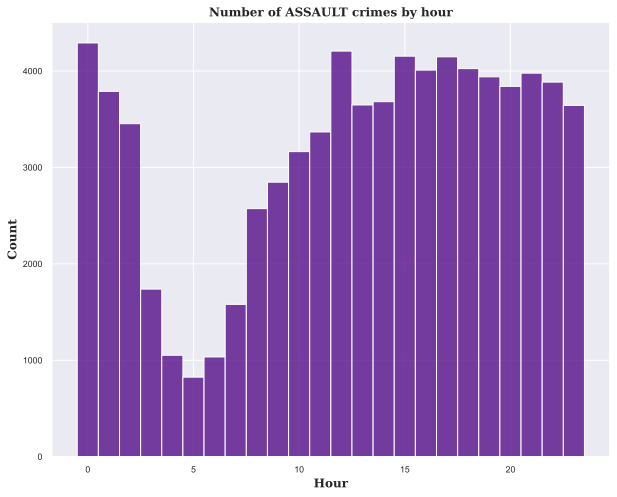

In [97]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df.loc[TARGET=='ASSAULT','Hour'], color='indigo', bins=24, discrete=True)
plt.title('Number of ASSAULT crimes by hour', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Hour', fontdict=label_font)
plt.show()

С учетом специфики данного преступления ничего удивительного, что картина несколько отличается от общей. В этом случае доля преступлений в ночные часы значительно выше, чем в среднем по датасету. Возможно стоит ввести дополнительную переменную, которая будет отвечать за время суток.

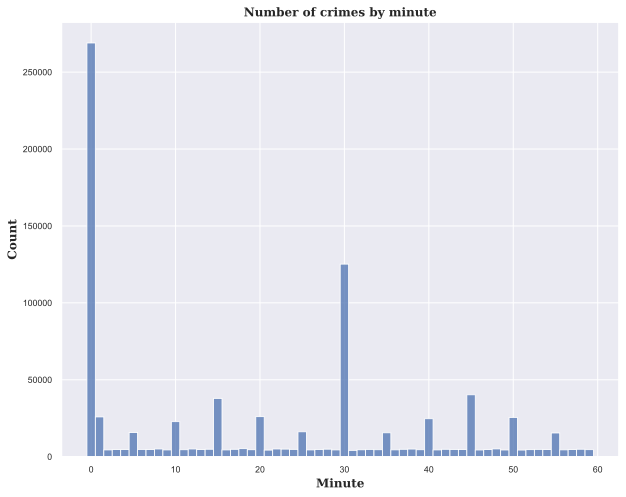

In [98]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df['Minute'], bins=60, discrete=True)
plt.title('Number of crimes by minute', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Minute', fontdict=label_font)
plt.show()

Здесь видны пики на минутах, оканчивающихся на 0 и 5. Скорее всего это связано с удобством при регистрации правонарушения.

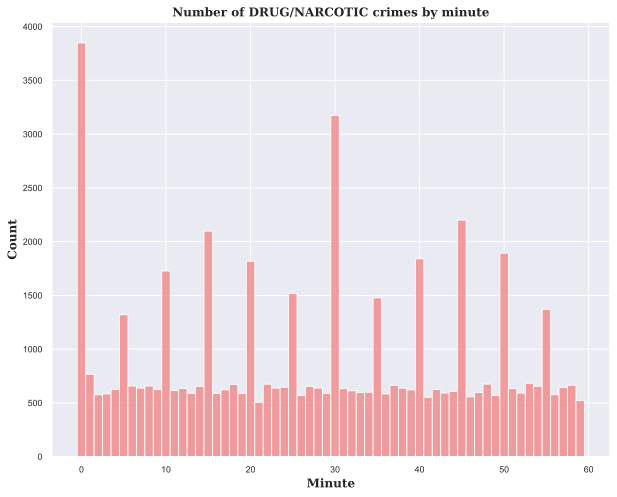

In [99]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(x=df.loc[TARGET=='DRUG/NARCOTIC','Minute'], color='lightcoral', bins=60, discrete=True)
plt.title('Number of DRUG/NARCOTIC crimes by minute', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Minute', fontdict=label_font)
plt.show()

Видно, что для данного типа правонарушений график очень похож на полученный для всего датасета.

#### DayOfWeek

In [102]:
df['DayOfWeek'].value_counts()

Friday       133734
Wednesday    129211
Saturday     126810
Thursday     125038
Tuesday      124965
Monday       121584
Sunday       116707
Name: DayOfWeek, dtype: int64

Можно утверждать, что в пятницу совершается больше всего преступлений, в то время как воскресенье наименее опасный день недели.

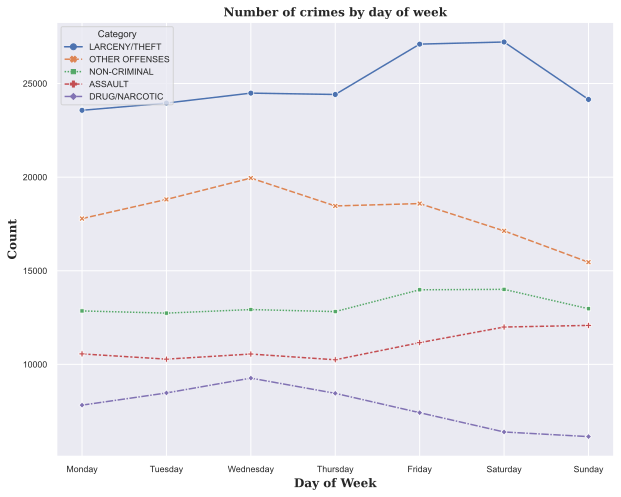

In [446]:
most_frequent_crimes = TARGET.value_counts().index.to_list()[:5]
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

days_target = df.groupby(['DayOfWeek', 'Category']).size().reset_index().rename(columns={0:'Count'})
days_target = days_target[days_target['Category'].isin(most_frequent_crimes)]
days_target['DayOfWeek'] = pd.Categorical(days_target['DayOfWeek'],categories=days)
days_target['Category'] = pd.Categorical(days_target['Category'],categories=most_frequent_crimes)
days_target = days_target.sort_values('DayOfWeek')


plt.figure(figsize=(10, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.lineplot(x='DayOfWeek', y='Count', hue='Category', data=days_target, markers=True, style='Category')
plt.title('Number of crimes by day of week', fontdict=label_font)
plt.ylabel('Count', fontdict=label_font)
plt.xlabel('Day of Week', fontdict=label_font)
plt.show()

Даже на примере пяти самых часто совершаемых преступлений видно, что распределение правонарушений по дням недели может сильно различаться. Например, больше всего преступлений, относящихся к категориям `OTHER OFFENSES` и `DRUG/NARCOTIC` совершается в среду, после чего идет спад. Другая динамика наблюдается для грабежей.

#### PdDistrict

In [107]:
df['PdDistrict'].value_counts()

SOUTHERN      157182
MISSION       119908
NORTHERN      105296
BAYVIEW        89431
CENTRAL        85460
TENDERLOIN     81809
INGLESIDE      78845
TARAVAL        65596
PARK           49313
RICHMOND       45209
Name: PdDistrict, dtype: int64

В городе находится 10 полицейских участков. Из данных можно сделать вывод, что большее количество преступлений регистрируется в отделе `SOUTHERN`.

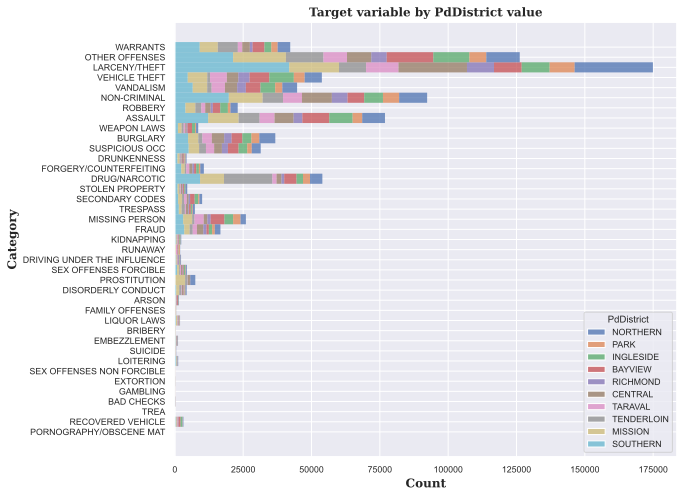

In [109]:
plt.figure(figsize=(9, 8))
sns.set(font_scale=0.8, style='darkgrid')
sns.histplot(y=TARGET, hue=df['PdDistrict'], multiple='stack')
plt.title('Target variable by PdDistrict value', fontdict=label_font)
plt.ylabel('Category', fontdict=label_font)
plt.xlabel('Count', fontdict=label_font)
plt.show()

Этот график показывает, что данный признак может быть довольно полезным при классификации, т.к. некоторые типы преступлений регистрируются в определенных отделах чаще, чем в других. Например, преступления связанные с наркотиками намного чаще фиксируются в отделе `TENDERLOIN`. Большая часть пропажи людей регистрируется в отделе `BAYVIEW`, а преступления связанные с проституцией чаще всего фиксируется отделом `MISSION`.

#### Address

In [184]:
df['Address'].value_counts()

800 Block of BRYANT ST          26533
800 Block of MARKET ST           6581
2000 Block of MISSION ST         5097
1000 Block of POTRERO AV         4063
900 Block of MARKET ST           3251
                                ...  
OXFORD ST / WAYLAND ST              1
PACHECO ST / 30TH AV                1
2300 Block of NORTH POINT ST        1
JUNIPERO SERRA BL / WYTON LN        1
ORDWAY ST / SOMERSET ST             1
Name: Address, Length: 23228, dtype: int64

Видим, что в датасете содержится много разных адресов, однако можно выделить определенные места, где происходит значительное количество преступлений.

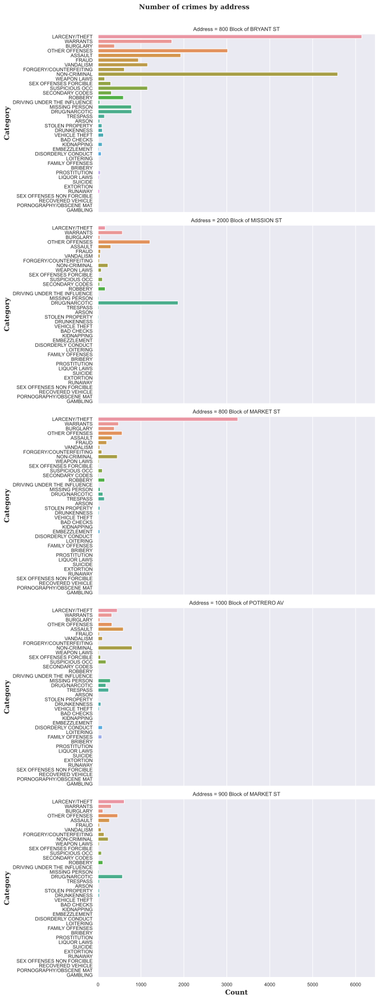

In [481]:
most_frequent_addresses = df['Address'].value_counts().index.to_list()[:5]

adr_target = df[df['Address'].isin(most_frequent_addresses)][['Address','Category']]
adr_target


sns.set(font_scale=0.8, style='darkgrid')
cp = sns.catplot(y='Category', row='Address', data=adr_target, kind='count', orient='h', height=5, aspect=1.85)
cp.fig.subplots_adjust(top=0.95)
cp.set_xlabels('Count', fontdict=label_font)
cp.set_ylabels('Category', fontdict=label_font)
cp.fig.suptitle('Number of crimes by address', fontsize=12, fontweight='bold', family='serif')
plt.show()

Из этих графиков становится понятно, что распределение преступлений по адресам неравномерно. Например, по адресу __800 Block of BRYANT ST__ происходит много грабежей и некриминальных правонарушений, в то время для адреса __2000 Block of MISSION ST__ характерно преобладание преступлений связанных с наркотиками.

## Предобработка данных <a class="anchor" id="preparation"></a>

In [485]:
test = pd.read_csv('test.csv')
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884262 entries, 0 to 884261
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Id          884262 non-null  int64  
 1   Dates       884262 non-null  object 
 2   DayOfWeek   884262 non-null  object 
 3   PdDistrict  884262 non-null  object 
 4   Address     884262 non-null  object 
 5   X           884262 non-null  float64
 6   Y           884262 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 47.2+ MB


Пропусков ни в тренировочном, ни в тестовом датасете нет, поэтому проблемы заполнения пропущенной информации в наблюдениях не стоит.

In [486]:
test.describe()

,Id,X,Y
count,884262.000000,884262.000000,884262.000000
mean,442130.500000,-122.422693,37.771476
std,255264.596205,0.030985,0.484824
min,0.000000,-122.513642,37.707879
25%,221065.250000,-122.433069,37.752374
50%,442130.500000,-122.416517,37.775421
75%,663195.750000,-122.406959,37.784353
max,884261.000000,-120.500000,90.000000


В тестовом датасете так же, как и в тренировочном присутствуют выбросы для географических координат. По моему мнению эти значения можно оставить без дополнительных корректировок, создав при этом дамми переменную, которая будет принимать значение равное _1_ для наблюдений с выбросами.

Таким образом какой-либо серьезной предобработки данных в этой задаче не требуется.

## Построение новых признаков <a class="anchor" id="new_features"></a>

Прежде всего создадим дополнительный признак, речь о котором шла в предыдущей части. Он принимает значение равное _1_, если наблюдение является выбросом с точки зрения географических координат.

In [487]:
df['GPS_Outlier'] = 0
df.loc[df['Y'] == 90, 'GPS_Outlier'] = 1
df['GPS_Outlier'].value_counts()

0    877982
1        67
Name: GPS_Outlier, dtype: int64

Добавим также дополнительные признаки, которые учитывают время года и суток.

In [488]:
df['Season'] = 'Winter'
df.loc[(df['Month'] > 2) & (df['Month'] < 6), 'Season'] = 'Spring'
df.loc[(df['Month'] >= 6) & (df['Month'] < 9), 'Season'] = 'Summer'
df.loc[(df['Month'] >= 9) & (df['Month'] < 12), 'Season'] = 'Autumn'
df.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,...,Distance to TENDERLOIN,Distance to INGLESIDE,Distance to TARAVAL,Distance to PARK,Distance to RICHMOND,Crossroad,STREET_1,STREET_2,GPS_Outlier,Season
0,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,1.611772,5.790491,5.896829,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring
1,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,1.611772,5.790491,5.896829,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring
2,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23,...,2.140530,8.600664,7.996358,4.485092,4.085853,1,GREENWICH ST,VANNESS AV,0,Spring
3,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23,...,2.309632,8.603412,7.896440,4.394285,3.924613,0,LOMBARD ST,None,0,Spring
4,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23,...,2.735294,5.219918,4.794570,1.453033,2.350841,0,BRODERICK ST,None,0,Spring


In [490]:
df['DayPeriod'] = 'Night'
df.loc[(df['Hour'] > 5) & (df['Hour'] < 12), 'DayPeriod'] = 'Morning'
df.loc[(df['Hour'] >= 12) & (df['Hour'] < 18), 'DayPeriod'] = 'Afternoon'
df.loc[(df['Hour'] >= 18) & (df['Hour'] <= 23), 'DayPeriod'] = 'Evening'
df.tail()

,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,...,Distance to INGLESIDE,Distance to TARAVAL,Distance to PARK,Distance to RICHMOND,Crossroad,STREET_1,STREET_2,GPS_Outlier,Season,DayPeriod
878044,ROBBERY,Monday,TARAVAL,FARALLONES ST / CAPITOL AV,-122.459033,37.714056,2003,1,6,0,...,1.688335,3.815284,6.003640,7.359576,1,CAPITOL AV,FARALLONES ST,0,Winter,Night
878045,LARCENY/THEFT,Monday,INGLESIDE,600 Block of EDNA ST,-122.447364,37.731948,2003,1,6,0,...,0.797157,3.204086,4.052341,5.538155,0,EDNA ST,None,0,Winter,Night
878046,LARCENY/THEFT,Monday,SOUTHERN,5TH ST / FOLSOM ST,-122.403390,37.780266,2003,1,6,0,...,7.187725,7.899078,4.707368,5.252891,1,5TH ST,5TH ST,0,Winter,Night
878047,VANDALISM,Monday,SOUTHERN,TOWNSEND ST / 2ND ST,-122.390531,37.780607,2003,1,6,0,...,7.861542,8.905915,5.807007,6.383162,1,2ND ST,TOWNSEND ST,0,Winter,Night
878048,FORGERY/COUNTERFEITING,Monday,BAYVIEW,1800 Block of NEWCOMB AV,-122.394926,37.738212,2003,1,6,0,...,4.696550,7.554736,6.202717,7.598763,0,NEWCOMB AV,None,0,Winter,Night


Создадим признак, который будет отражать является день рабочим или выходным (праздники не учитываются).

In [493]:
df['DayType'] = 'Working day'
df.loc[(df['DayOfWeek'] == 'Saturday') | (df['DayOfWeek'] == 'Sunday'), 'DayType'] = 'Weekend'
df.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,...,Distance to TARAVAL,Distance to PARK,Distance to RICHMOND,Crossroad,STREET_1,STREET_2,GPS_Outlier,Season,DayPeriod,DayType
0,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,5.896829,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring,Evening,Working day
1,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,5.896829,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring,Evening,Working day
2,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23,...,7.996358,4.485092,4.085853,1,GREENWICH ST,VANNESS AV,0,Spring,Evening,Working day
3,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23,...,7.896440,4.394285,3.924613,0,LOMBARD ST,None,0,Spring,Evening,Working day
4,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23,...,4.794570,1.453033,2.350841,0,BRODERICK ST,None,0,Spring,Evening,Working day


Воспользуемся информацией с сайта https://sfgov.org/policecommission//police-district-maps, чтобы определить адреса полицейских участков и их географические координаты. А затем на основе этих данных рассчитаем расстояния в км между местом происшествия и полицейскими участками. Для этого воспользуемся функцией для формулы гаверсинуса.

In [495]:
police_df = pd.DataFrame({'PdDistrict':df['PdDistrict'].value_counts().index.to_list(), 
                          'Longitude':[-122.38911889490787, -122.42123252615441, 
                                       -122.43194094703667, -122.3971474740263,
                                       -122.40972615073059, -122.41183258992973,
                                       -122.44561441450864, -122.48054543595472, 
                                       -122.45462700286053, -122.4631604420589],
                         'Latitude': [37.77299921399094, 37.7629253150711, 37.78036805359033, 37.72998061844175,
                                     37.79867804379176, 37.78390608991547, 37.724913303574716, 37.7438522542276,
                                     37.76793575897657, 37.780162016196726]})
police_df

,PdDistrict,Longitude,Latitude
0,SOUTHERN,-122.389119,37.772999
1,MISSION,-122.421233,37.762925
2,NORTHERN,-122.431941,37.780368
3,BAYVIEW,-122.397147,37.729981
4,CENTRAL,-122.409726,37.798678
5,TENDERLOIN,-122.411833,37.783906
6,INGLESIDE,-122.445614,37.724913
7,TARAVAL,-122.480545,37.743852
8,PARK,-122.454627,37.767936
9,RICHMOND,-122.463160,37.780162


In [496]:
def haversine(lon1, lat1, lon2, lat2):
    # взято отсюда https://stackoverflow.com/questions/4913349/haversine-formula-in-python-bearing-and-distance-between-two-gps-points
    # переводим координаты в радианы
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # формула гаверсинуса
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371
    
    return c * r

In [497]:
departments = df['PdDistrict'].value_counts().index.to_list()
for dep in departments:
    p_long = police_df.loc[police_df['PdDistrict']==dep, 'Longitude']
    p_lat = police_df.loc[police_df['PdDistrict']==dep, 'Latitude']
    df['Distance to ' + dep] = [haversine(x, y, p_long, p_lat) for (x, y) in zip(df['X'], df['Y'])]
df.head()

Далее добавим дамми переменную, которая будет принимать значение равное _1_, если адрес находится на перекрестке двух улиц. В остальных случаях она будет равна _0_.

In [499]:
df['Crossroad'] = [1 if '/' in x else 0 for x in df['Address']]
df['Crossroad'].value_counts()

0    617231
1    260818
Name: Crossroad, dtype: int64

Создадим также дополнительные признаки для названий улиц, в которых среди прочего учтем, что улицы для адресов на перекрестках могут быть записаны в разном порядке.

In [528]:
def ustrip(s):
    return s.strip()

In [534]:
df['STREET_1'] = 'None'
df['STREET_2'] = 'None'
df.loc[df['Crossroad'] == 0, 'STREET_1'] = [x.split('of ')[1] for x in df.loc[df['Crossroad'] == 0,'Address']]
df.loc[df['Crossroad'] == 1, 'STREET_1'] = [sorted(x.split(' / '))[0] for x in df.loc[df['Crossroad'] == 1,'Address']]
df.loc[df['Crossroad'] == 1, 'STREET_2'] = [sorted(map(ustrip, x.split('/')))[1] for x in df.loc[df['Crossroad'] == 1,'Address']]
df.head(20)

,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,...,Distance to TARAVAL,Distance to PARK,Distance to RICHMOND,Crossroad,STREET_1,STREET_2,GPS_Outlier,Season,DayPeriod,DayType
0,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,5.896829,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring,Evening,Working day
1,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,5.896829,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring,Evening,Working day
2,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23,...,7.996358,4.485092,4.085853,1,GREENWICH ST,VANNESS AV,0,Spring,Evening,Working day
3,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23,...,7.896440,4.394285,3.924613,0,LOMBARD ST,None,0,Spring,Evening,Working day
4,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23,...,4.794570,1.453033,2.350841,0,BRODERICK ST,None,0,Spring,Evening,Working day
5,LARCENY/THEFT,Wednesday,INGLESIDE,0 Block of TEDDY AV,-122.403252,37.713431,2015,5,13,23,...,7.592789,7.559058,9.099696,0,TEDDY AV,None,0,Spring,Evening,Working day
6,VEHICLE THEFT,Wednesday,INGLESIDE,AVALON AV / PERU AV,-122.423327,37.725138,2015,5,13,23,...,5.445057,5.497344,7.049757,1,AVALON AV,PERU AV,0,Spring,Evening,Working day
7,VEHICLE THEFT,Wednesday,BAYVIEW,KIRKWOOD AV / DONAHUE ST,-122.371274,37.727564,2015,5,13,23,...,9.778244,8.594260,9.973204,1,DONAHUE ST,KIRKWOOD AV,0,Spring,Evening,Working day
8,LARCENY/THEFT,Wednesday,RICHMOND,600 Block of 47TH AV,-122.508194,37.776601,2015,5,13,23,...,4.378156,4.805818,3.977619,0,47TH AV,None,0,Spring,Evening,Working day
9,LARCENY/THEFT,Wednesday,CENTRAL,JEFFERSON ST / LEAVENWORTH ST,-122.419088,37.807802,2015,5,13,23,...,8.929750,5.422523,4.943955,1,JEFFERSON ST,LEAVENWORTH ST,0,Spring,Evening,Working day


In [535]:
df['Modified Address'] = df['Address']
df.loc[df['Crossroad'] == 1, 'Modified Address'] = df.loc[df['Crossroad'] == 1, 'STREET_1'] + ' / ' + df.loc[df['Crossroad'] == 1, 'STREET_2']
df.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,...,Distance to PARK,Distance to RICHMOND,Crossroad,STREET_1,STREET_2,GPS_Outlier,Season,DayPeriod,DayType,Modified Address
0,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring,Evening,Working day,LAGUNA ST / OAK ST
1,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,2.632123,3.333388,1,LAGUNA ST,OAK ST,0,Spring,Evening,Working day,LAGUNA ST / OAK ST
2,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23,...,4.485092,4.085853,1,GREENWICH ST,VANNESS AV,0,Spring,Evening,Working day,GREENWICH ST / VANNESS AV
3,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23,...,4.394285,3.924613,0,LOMBARD ST,None,0,Spring,Evening,Working day,1500 Block of LOMBARD ST
4,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23,...,1.453033,2.350841,0,BRODERICK ST,None,0,Spring,Evening,Working day,100 Block of BRODERICK ST


Также можно воспользоваться идеей, предложенной в этой работе (https://www.kaggle.com/papadopc/neural-nets-and-address-featurization/), и посчитать логарифм шансов для адресов.

In [762]:
ad_counts = df.groupby(['Modified Address']).size()
# cat_counts = df.groupby(['Category']).size()
# ad_cat_counts = df.groupby(['Modified Address', 'Category']).size()
# ad_cat_counts
ad_counts

Modified Address
0 Block of  HARRISON ST       1
0 Block of 10TH AV            5
0 Block of 10TH ST           49
0 Block of 11TH ST           48
0 Block of 12TH AV            7
                             ..
WAYLAND ST / YALE ST          2
WEBSTER ST / WILMOT ST        2
WELSH ST / ZOE ST             8
WILLARD ST / WOODLAND AV      4
WILLIAMS AV / YOSEMITE AV     1
Length: 17812, dtype: int64

In [763]:
ad_logodds = pd.DataFrame(np.log(ad_counts/len(df))-np.log(1.0-ad_counts/len(df))).reset_index().rename(columns={0:'Log Odds'})
ad_logodds

,Modified Address,Log Odds
0,0 Block of HARRISON ST,-13.685457
1,0 Block of 10TH AV,-12.076014
2,0 Block of 10TH ST,-9.793582
3,0 Block of 11TH ST,-9.814202
4,0 Block of 12TH AV,-11.739540
...,...,...
17807,WAYLAND ST / YALE ST,-12.992308
17808,WEBSTER ST / WILMOT ST,-12.992308
17809,WELSH ST / ZOE ST,-11.606007
17810,WILLARD ST / WOODLAND AV,-12.299159


In [765]:
df = df.merge(ad_logodds, on='Modified Address', how='left')
df.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,Year,Month,Day,Hour,...,DayType,Modified Address,Log Odds_x,Log Odds_y,Log Odds_x,Log Odds_y,Log Odds_x,Log Odds_y,Log Odds_x,Log Odds_y
0,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,Working day,LAGUNA ST / OAK ST,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710
1,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23,...,Working day,LAGUNA ST / OAK ST,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710,-9.408710
2,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23,...,Working day,GREENWICH ST / VANNESS AV,-10.219685,-10.219685,-10.219685,-10.219685,-10.219685,-10.219685,-10.219685,-10.219685
3,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23,...,Working day,1500 Block of LOMBARD ST,-8.641856,-8.641856,-8.641856,-8.641856,-8.641856,-8.641856,-8.641856,-8.641856
4,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23,...,Working day,100 Block of BRODERICK ST,-9.734155,-9.734155,-9.734155,-9.734155,-9.734155,-9.734155,-9.734155,-9.734155


Создадим отдельный класс для генерации новых признаков для удобства работы с датасетами далее:

In [672]:
class FeatureGenerator():
    
    def __init__(self):
        self.police_df = pd.DataFrame({'PdDistrict':df['PdDistrict'].value_counts().index.to_list(), 
                          'Longitude':[-122.38911889490787, -122.42123252615441, 
                                       -122.43194094703667, -122.3971474740263,
                                       -122.40972615073059, -122.41183258992973,
                                       -122.44561441450864, -122.48054543595472, 
                                       -122.45462700286053, -122.4631604420589],
                         'Latitude': [37.77299921399094, 37.7629253150711, 37.78036805359033, 37.72998061844175,
                                     37.79867804379176, 37.78390608991547, 37.724913303574716, 37.7438522542276,
                                     37.76793575897657, 37.780162016196726]})
        
        
    
    def fit(self, Z, y=None):
        pass
        
            
        
        
    def transform(self, X):
        X['Dates']= pd.to_datetime(X['Dates'], format='%Y-%m-%d %H:%M:%S')
        if 'Descript' in X.columns:
            X.drop(columns=['Descript'], inplace=True)
        
        if 'Resolution' in X.columns:
            X.drop(columns=['Resolution'], inplace=True)
        
        
        X['GPS_Outlier'] = 0
        X.loc[X['Y'] == 90, 'GPS_Outlier'] = 1
        
        X['Year'] = X['Dates'].dt.year
        X['Month'] = X['Dates'].dt.month
        X['Day'] = X['Dates'].dt.day
        X['Hour'] = X['Dates'].dt.hour
        X['Minute'] = X['Dates'].dt.minute
        
        X['Season'] = 'Winter'
        X.loc[(X['Month'] > 2) & (X['Month'] < 6), 'Season'] = 'Spring'
        X.loc[(X['Month'] >= 6) & (X['Month'] < 9), 'Season'] = 'Summer'
        X.loc[(X['Month'] >= 9) & (X['Month'] < 12), 'Season'] = 'Autumn'
        
        X['DayPeriod'] = 'Night'
        X.loc[(X['Hour'] > 5) & (X['Hour'] < 12), 'DayPeriod'] = 'Morning'
        X.loc[(X['Hour'] >= 12) & (X['Hour'] < 18), 'DayPeriod'] = 'Afternoon'
        X.loc[(X['Hour'] >= 18) & (X['Hour'] <= 23), 'DayPeriod'] = 'Evening'
        
        X['DayType'] = 'Working day'
        X.loc[(X['DayOfWeek'] == 'Saturday') | (X['DayOfWeek'] == 'Sunday'), 'DayType'] = 'Weekend'
        
        departments = X['PdDistrict'].value_counts().index.to_list()
        
        for dep in departments:
            p_long = self.police_df.loc[self.police_df['PdDistrict']==dep, 'Longitude']
            p_lat = self.police_df.loc[self.police_df['PdDistrict']==dep, 'Latitude']
            X['Distance to ' + dep] = [haversine(x, y, p_long, p_lat) for (x, y) in zip(X['X'], X['Y'])]
        
        X['Crossroad'] = [1 if '/' in x else 0 for x in X['Address']]
        
        X['STREET_1'] = 'None'
        X['STREET_2'] = 'None'
        X.loc[X['Crossroad'] == 0, 'STREET_1'] = [x.split('of ')[1] for x in X.loc[X['Crossroad'] == 0,'Address']]
        X.loc[X['Crossroad'] == 1, 'STREET_1'] = [sorted(x.split(' / '))[0] for x in X.loc[X['Crossroad'] == 1,'Address']]
        X.loc[X['Crossroad'] == 1, 'STREET_2'] = [sorted(map(ustrip, x.split('/')))[1] for x in X.loc[X['Crossroad'] == 1,'Address']]
        X['Modified Address'] = X['Address']
        X.loc[X['Crossroad'] == 1, 'Modified Address'] = X.loc[X['Crossroad'] == 1, 'STREET_1'] + ' / ' + X.loc[X['Crossroad'] == 1, 'STREET_2']
        X.drop(columns=['STREET_1', 'STREET_2'], inplace=True)
        
        ad_counts = X.groupby(['Modified Address']).size()
        ad_logodds = pd.DataFrame(np.log(ad_counts/len(X))-np.log(1.0-ad_counts/len(X))).reset_index().rename(columns={0:'Log Odds'})
        
        X = X.merge(ad_logodds, on='Modified Address', how='left')
        
        X.drop(columns=['Dates', 'Address'], inplace=True)

        return X

## Построение модели <a class="anchor" id="model"></a>

In [729]:
train_df = pd.read_csv('train.csv')
train_df.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [730]:
y = train_df['Category']
X = train_df.drop(columns=['Category'])

In [731]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.25, 
                                                      shuffle=True, random_state=0, stratify=y)

In [732]:
features = FeatureGenerator()
features.fit(X_train, y_train)
X_train = features.transform(X_train)
X_valid = features.transform(X_valid)

In [733]:
X_train

,DayOfWeek,PdDistrict,X,Y,GPS_Outlier,Year,Month,Day,Hour,Minute,...,Distance to BAYVIEW,Distance to CENTRAL,Distance to TENDERLOIN,Distance to INGLESIDE,Distance to TARAVAL,Distance to PARK,Distance to RICHMOND,Crossroad,Modified Address,Log Odds
0,Friday,PARK,-122.447761,37.769846,0,2014,5,2,18,43,...,6.281151,4.631449,3.523526,4.999906,4.081834,0.639806,1.774132,0,1500 Block of HAIGHT ST,-7.592135
1,Friday,NORTHERN,-122.420250,37.780075,0,2003,9,5,11,45,...,5.928946,2.265929,0.853697,6.526433,6.657028,3.309215,3.771149,1,MCALLISTER ST / VAN NESS AV,-9.684140
2,Sunday,INGLESIDE,-122.416446,37.732916,0,2010,12,19,5,45,...,1.728282,7.336197,5.684299,2.715195,5.766220,5.141181,6.668199,0,800 Block of ELLSWORTH ST,-8.182559
3,Saturday,CENTRAL,-122.398862,37.800781,0,2011,2,26,20,55,...,7.874086,0.982768,2.195423,9.383934,9.571649,6.111860,6.097532,1,GREEN ST / THE EMBARCADERONORTH ST,-9.238794
4,Tuesday,TARAVAL,-122.481281,37.760556,0,2011,8,9,11,40,...,8.141411,7.583879,6.633336,5.054031,1.858539,2.482499,2.699879,0,1400 Block of 23RD AV,-10.453307
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
658531,Saturday,BAYVIEW,-122.394439,37.736444,0,2005,2,12,17,15,...,0.757129,7.049379,5.494598,4.679633,7.616236,6.345348,7.754336,0,1400 Block of PHELPS ST,-6.327818
658532,Friday,BAYVIEW,-122.396469,37.736118,0,2008,3,7,19,0,...,0.685066,7.053276,5.482736,4.498051,7.442926,6.217849,7.639307,0,1900 Block of QUESADA AV,-10.139638
658533,Wednesday,PARK,-122.441394,37.771727,0,2012,5,30,2,15,...,6.056512,4.089656,2.929812,5.218691,4.631832,1.237219,2.130612,0,1200 Block of PAGE ST,-7.237961
658534,Thursday,BAYVIEW,-122.392628,37.738244,0,2005,3,24,3,20,...,1.001120,6.885963,5.350697,4.889842,7.755799,6.372686,7.757029,0,1100 Block of PHELPS ST,-10.219684


In [734]:
train_dataset = catb.Pool(data=X_train,
                     label=y_train,
                     cat_features=['DayOfWeek', 'PdDistrict', 'Season', 'DayPeriod', 'DayType', 'Modified Address'])

eval_dataset = catb.Pool(data=X_valid,
                     label=y_valid,
                     cat_features=['DayOfWeek', 'PdDistrict', 'Season', 'DayPeriod', 'DayType', 'Modified Address'])

In [735]:
model = catb.CatBoostClassifier(iterations=50, max_depth=6,
                                     learning_rate=0.02,
                                     silent=True, random_state=0,
                           loss_function='MultiClass', eval_metric='Accuracy')

In [736]:
model.fit(train_dataset)

In [740]:
y_train_pred = model.predict(X_train)
y_valid_pred = model.predict(X_valid)

In [766]:
print('TRAIN\n\n' + classification_report(y_train, y_train_pred))

TRAIN

                             precision    recall  f1-score   support

                      ARSON       0.00      0.00      0.00      1135
                    ASSAULT       0.16      0.13      0.15     57657
                 BAD CHECKS       0.00      0.00      0.00       305
                    BRIBERY       0.00      0.00      0.00       217
                   BURGLARY       0.00      0.00      0.00     27566
         DISORDERLY CONDUCT       0.00      0.00      0.00      3240
DRIVING UNDER THE INFLUENCE       0.00      0.00      0.00      1701
              DRUG/NARCOTIC       0.29      0.34      0.31     40478
                DRUNKENNESS       0.00      0.00      0.00      3210
               EMBEZZLEMENT       0.00      0.00      0.00       874
                  EXTORTION       0.00      0.00      0.00       192
            FAMILY OFFENSES       0.00      0.00      0.00       368
     FORGERY/COUNTERFEITING       0.00      0.00      0.00      7957
                      FRAU

In [767]:
print('TEST\n\n' + classification_report(y_valid, y_valid_pred))

TEST

                             precision    recall  f1-score   support

                      ARSON       0.00      0.00      0.00       378
                    ASSAULT       0.16      0.13      0.14     19219
                 BAD CHECKS       0.00      0.00      0.00       101
                    BRIBERY       0.00      0.00      0.00        72
                   BURGLARY       0.00      0.00      0.00      9189
         DISORDERLY CONDUCT       0.00      0.00      0.00      1080
DRIVING UNDER THE INFLUENCE       0.00      0.00      0.00       567
              DRUG/NARCOTIC       0.29      0.34      0.31     13493
                DRUNKENNESS       0.00      0.00      0.00      1070
               EMBEZZLEMENT       0.00      0.00      0.00       292
                  EXTORTION       0.00      0.00      0.00        64
            FAMILY OFFENSES       0.00      0.00      0.00       123
     FORGERY/COUNTERFEITING       0.00      0.00      0.00      2652
                      FRAUD

In [741]:
fi = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=['importance'])
fi.sort_values(by='importance', ascending=False)

,importance
Minute,29.623864
Crossroad,23.707402
PdDistrict,14.837584
Log Odds,9.215422
DayPeriod,5.511664
Distance to TENDERLOIN,3.509616
Distance to NORTHERN,2.600163
Distance to TARAVAL,2.540941
Distance to RICHMOND,2.137429
Distance to PARK,1.169110


## Сохранение результатов <a class="anchor" id="results"></a>

In [744]:
test_df = pd.read_csv('test.csv')

In [745]:
X_test = test_df.drop(columns=['Id'])
X_test = features.transform(X_test)
y_test = model.predict(X_test)

In [752]:
predicted = pd.DataFrame(model.predict_proba(X_test))

In [755]:
predicted.columns = model.classes_

In [756]:
prediction = pd.concat([pd.DataFrame({'Id': test_df['Id']}), predicted], axis=1)
prediction.head()

,Id,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,...,SEX OFFENSES NON FORCIBLE,STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
0,0,0.012499,0.106401,0.009554,0.009898,0.035594,0.011997,0.011347,0.040815,0.012987,...,0.009537,0.013091,0.010108,0.041812,0.009453,0.015272,0.052169,0.049823,0.041214,0.023684
1,1,0.010719,0.054117,0.009365,0.009618,0.010405,0.011981,0.014222,0.074138,0.013281,...,0.009411,0.012630,0.009410,0.028818,0.009363,0.010084,0.026347,0.025212,0.063303,0.022954
2,2,0.011206,0.077803,0.009612,0.009646,0.056632,0.012591,0.011138,0.035481,0.013853,...,0.009495,0.015390,0.010253,0.035899,0.009465,0.017269,0.049590,0.033825,0.039156,0.015815
3,3,0.011484,0.103459,0.009612,0.009890,0.029954,0.012381,0.011093,0.044911,0.013636,...,0.009618,0.012904,0.010057,0.038369,0.009493,0.016154,0.047563,0.036451,0.044861,0.022876
4,4,0.011484,0.103459,0.009612,0.009890,0.029954,0.012381,0.011093,0.044911,0.013636,...,0.009618,0.012904,0.010057,0.038369,0.009493,0.016154,0.047563,0.036451,0.044861,0.022876


In [759]:
prediction.to_csv('s1.csv', index=False)